# Visual Genome Region Description Embeddings

In [3]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import numpy as np
from visual_genome import api as vg
import urllib.request
from PIL import Image
import tensorflow as tf
import json
import nltk
import time
import torch
import re
import seaborn as sns
import pandas as pd
from nltk.cluster import KMeansClusterer
from sklearn.metrics.pairwise import cosine_similarity
from sentence_transformers import SentenceTransformer, util
from nltk.cluster import KMeansClusterer
from scipy.spatial import distance_matrix, distance
from sklearn.manifold import TSNE

## Images visualizations

In [5]:
def visualize_regions(image, regions):
    fig = plt.gcf()
    fig.set_size_inches(18.5, 10.5)
    img = Image.open(urllib.request.urlopen(image.url))
    plt.imshow(img)
    ax = plt.gca()
    for region in regions:
        ax.add_patch(Rectangle((region.x, region.y),
                               region.width,
                               region.height,
                               fill=False,
                               edgecolor='red',
                               linewidth=3))
        ax.text(region.x, region.y, region.phrase, style='italic', bbox={'facecolor':'white', 'alpha':0.7, 'pad':10})
    fig = plt.gcf()
    plt.tick_params(labelbottom='off', labelleft='off')
    plt.show()

In [6]:
def retrieve_image(image_id):
    # find the image from api
    image = vg.get_image_data(id=image_id)   # api also works here
    if image:
        print ("Image data:", image)
        reg = vg.get_region_descriptions_of_image(id=image_id)
        # show images
        visualize_regions(image, reg[:8])    # call with fewer regions for better visualization

## SentenceTransformer

In [7]:
# pre-trained models
#model_1 = SentenceTransformer('bert-base-nli-mean-tokens')
#model_2 = SentenceTransformer('paraphrase-mpnet-base-v2')    # raises warning
#model_3 = SentenceTransformer('paraphrase-distilroberta-base-v2')
model_4 = SentenceTransformer('stsb-mpnet-base-v2')
#model_5 = SentenceTransformer('stsb-roberta-large')         # this is much slower, but the best for semantic similarity
models = [model_4]

In [8]:
def get_embeddings(model, region_sentences):
    sentence_embeddings = model.encode(region_sentences)
    return sentence_embeddings

## Read images and their descriptions


In [9]:
## Read images and their descriptions
image_regions = pd.read_csv("image_regions.xls")

In [10]:
image_regions.head()

,Image_id,region_sentences
0,1,"['the clock is green in colour', 'shade is alo..."
1,2,"['walk sign is lit up', 'man wearing silver ba..."
2,3,"['multi-line office phone system', 'electrical..."
3,4,"['blue curtains with sailboats on them.', 'a b..."
4,5,"['the floor is wooden', 'white cables are on t..."


In [11]:
image_regions["region_sentences"] = image_regions["region_sentences"].apply(eval)
regions = image_regions["region_sentences"].tolist()

# Get embeddings

In [12]:
key_list = ["embeddings_4"]
embeddings = dict.fromkeys(key_list)
for model, key in zip(models, key_list):
    values = []
    for corpus in regions:
        # returns a list of lists, one 768-length embedding per region sentence. 
        # Number of rows corresponds to number of sentences
        if corpus:
            emb = get_embeddings(model, corpus)
            # get mean value columnwise, so that sentence embeddings are averaged per region for each image
            emb = np.mean(np.array(emb), axis=0) 
            # for each model, a 768-length embedding is stored
            values.append(emb)
        else:
            values.append(0)
            print(0)

    embeddings[key] = values

In [13]:
for key in key_list:
    image_regions[key] = pd.Series(embeddings[key], index=image_regions.index) 
    # number of sentences x 768

In [14]:
image_regions.head()

,Image_id,region_sentences,embeddings_4
0,1,"[the clock is green in colour, shade is along ...","[0.01703354, 0.019782802, 0.029310936, 0.04675..."
1,2,"[walk sign is lit up, man wearing silver backp...","[0.013193016, 0.009443245, 0.037484784, 0.0437..."
2,3,"[multi-line office phone system, electrical an...","[0.004214091, -0.061781242, 0.04772938, -0.024..."
3,4,"[blue curtains with sailboats on them., a blac...","[0.05491674, -0.021497522, 0.020557746, -0.028..."
4,5,"[the floor is wooden, white cables are on the ...","[0.006389538, -0.010824619, 0.05034344, -0.014..."


# Clustering

In [15]:
def clustering_question(images_regions, key, NUM_CLUSTERS):

    sentences = images_regions['region_sentences']

    X = np.array(images_regions[key].tolist())

    data = images_regions[['Image_id', 'region_sentences', key]].copy()
    
    kclusterer = KMeansClusterer(
        NUM_CLUSTERS, distance=nltk.cluster.util.cosine_distance,
        avoid_empty_clusters=True)

    assigned_clusters = kclusterer.cluster(data[key], assign_clusters=True)

    data['cluster'] = pd.Series(assigned_clusters, index=data.index)
    data['centroid'] = data['cluster'].apply(lambda x: kclusterer.means()[x])

    return data, assigned_clusters

In [16]:
def distance_from_centroid(row):
    # type of emb and centroid is different, hence using tolist below
    return distance_matrix([row[key]], [row['centroid'].tolist()])[0][0]

In [ ]:
def nltk_inertia(feature_matrix, centroid):
    sum_ = []
    for i in range(feature_matrix.shape[0]):
        sum_.append(np.sum((feature_matrix[i] - centroid[i])**2))  

    return sum(sum_) 
def number_of_clusters(image_regions, key):
    sse = []
    list_k = list(range(10, 1000, 10))

    for k in list_k:
        data, assigned_clusters = clustering_question(image_regions, key, k)
        sse.append(nltk_inertia(data[key].to_numpy(), data.centroid.to_numpy()))

    # Plot sse against k
    plt.figure(figsize=(6, 6))
    plt.title('Elbow method for '+key)
    plt.plot(list_k, sse, '-o')
    plt.xlabel(r'Number of clusters k')
    plt.ylabel('Sum of squared distance')
    plt.show()
"""
for key in key_list:
    number_of_clusters(image_regions, key)
"""

In [35]:
n_clusters = 15

def make_clusters(key, images_regions, n_clusters):
    data, assigned_clusters = clustering_question(images_regions, key, NUM_CLUSTERS = n_clusters)
    # Compute centroid distance to the data
    data['distance_from_centroid'] = data.apply(distance_from_centroid, axis=1)
    return data

## TSNE visualizations

In [36]:
def tsne_visual(embedding_clusters, key):
    mat = np.matrix([x for x in embedding_clusters[key]])
    t_sne = TSNE(n_components=2)
    low_dim_data = t_sne.fit_transform(mat)
    print('Lower dim data has shape',low_dim_data.shape)
    tsne_df =  pd.DataFrame(low_dim_data, embedding_clusters['cluster'])
    plt.figure(figsize=(20,12))
    ax = sns.scatterplot(data=tsne_df[0], x=tsne_df[0], y=tsne_df[1], hue=tsne_df.index, palette = "viridis", s=80)
    ax.set_title('T-SNE BERT Embeddings')
    plt.show()
    return low_dim_data

## Similar image retrieval

In [19]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

In [90]:
def find_distances(images_regions, input_id, key, input_embedding = np.zeros(5)):
    distances = []     
    image_ids=images_regions.Image_id
    if input_id>0:
        reference_embedding = images_regions.loc[images_regions.Image_id == input_id][key]
        reference_embedding = reference_embedding.values[0].reshape(-1,1)
        corpus_embeddings = images_regions.loc[images_regions.Image_id != input_id][key]
    else:
        reference_embedding = input_embedding
        corpus_embeddings = images_regions[key]
        
    for j in range(len(corpus_embeddings)):  # rows of def_embeddings matrix
        defin = j
        if image_ids[j]!=input_id:      # avoid calculating distance with itself
            corpus = corpus_embeddings[j].reshape(-1,1)
            # euclidean distance between multidimensional vectors
            dist = distance.euclidean(reference_embedding, corpus)
            distances.append([image_ids[j], dist]) 
        
    # store in df
    col_names = ['image_id', 'distances']
    distances_df = pd.DataFrame(distances, columns=col_names)
    distances_df = distances_df.sort_values(by='distances', ascending=True)
    distances_df.to_csv('distances.csv', index=False)
    return distances_df

In [91]:
# given image id to retrieve its k most similar images

def retrieve_images(key, images_regions, input_id = -1, input_embedding = np.zeros(5)):
    print('Images retrieved using method:', key)
    top_k=10
    
    if input_id>0:
    # top_k results to return
        print('Reference image:', input_id)
        retrieve_image(input_id)
        distances_df=find_distances(images_regions, input_id, key)
    else:
        distances_df=find_distances(images_regions, input_id, key, input_embedding)
    top_images=distances_df.head(top_k)

    print("Top", top_k, "most similar images to image", input_id, "in Visual Genome:")
    for index, row in top_images.iterrows():   
        im_id = int(row.image_id)
        print("Image id:", im_id, "Euclidean distance: %.4f" % (row.distances))

        # find similar images from api and show
        retrieve_image(im_id)

    return top_images

# Method 4: stsb-mpnet-base-v2

In [37]:
embeddings_method = "embeddings_4"
embedding_clusters=make_clusters(embeddings_method, image_regions, n_clusters)
embedding_clusters.head(5)

,Image_id,region_sentences,embeddings_4,cluster,centroid,distance_from_centroid
0,1,"[the clock is green in colour, shade is along ...","[0.01703354, 0.019782802, 0.029310936, 0.04675...",3,"[0.0037546274, -0.023341028, 0.055039514, 0.00...",0.825698
1,2,"[walk sign is lit up, man wearing silver backp...","[0.013193016, 0.009443245, 0.037484784, 0.0437...",3,"[0.0037546274, -0.023341028, 0.055039514, 0.00...",0.836886
2,3,"[multi-line office phone system, electrical an...","[0.004214091, -0.061781242, 0.04772938, -0.024...",1,"[0.032272533, -0.0853414, 0.034700576, -0.0056...",0.949778
3,4,"[blue curtains with sailboats on them., a blac...","[0.05491674, -0.021497522, 0.020557746, -0.028...",1,"[0.032272533, -0.0853414, 0.034700576, -0.0056...",0.760849
4,5,"[the floor is wooden, white cables are on the ...","[0.006389538, -0.010824619, 0.05034344, -0.014...",1,"[0.032272533, -0.0853414, 0.034700576, -0.0056...",0.777348


Lower dim data has shape (108076, 2)


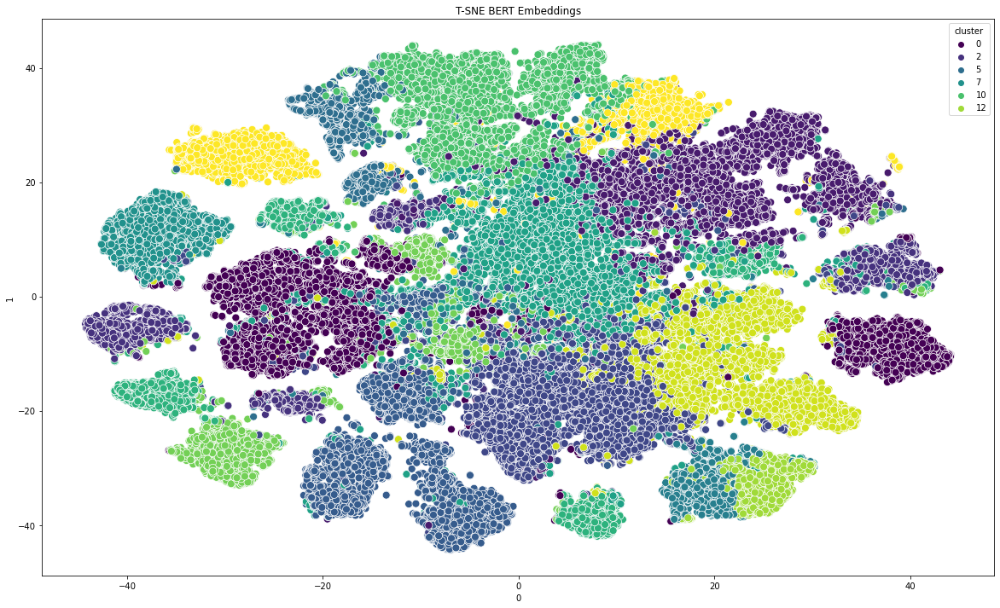

In [38]:
low_embedding_clusters=tsne_visual(embedding_clusters, embeddings_method)

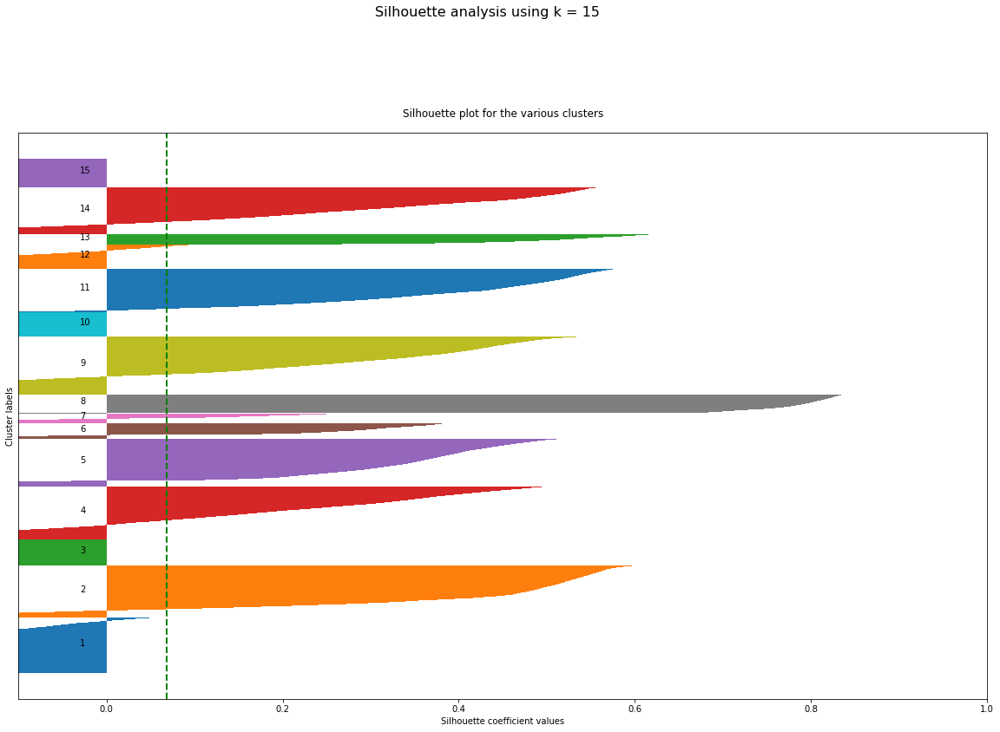

In [39]:
from sklearn.metrics import silhouette_samples, silhouette_score

# Get silhouette samples
low_embedding_clusters = low_embedding_clusters
embedding_clusters=embedding_clusters

plt.figure(figsize=(20,12))

embedding_samples = low_embedding_clusters
labels = embedding_clusters['cluster'].to_numpy()
silhouette_vals = silhouette_samples(embedding_samples, labels)

# Silhouette plot
y_ticks = []
y_lower, y_upper = 0, 0
for i, cluster in enumerate(np.unique(labels)):
    cluster_silhouette_vals = silhouette_vals[labels == cluster]
    cluster_silhouette_vals.sort()
    y_upper += len(cluster_silhouette_vals)
    plt.barh(range(y_lower, y_upper), cluster_silhouette_vals, edgecolor='none', height=1)
    plt.text(-0.03, (y_lower + y_upper) / 2, str(i + 1))
    y_lower += len(cluster_silhouette_vals)


avg_score = np.mean(silhouette_vals)
plt.axvline(avg_score, linestyle='--', linewidth=2, color='green')
plt.yticks([])
plt.xlim([-0.1, 1])
plt.xlabel('Silhouette coefficient values')
plt.ylabel('Cluster labels')
plt.title('Silhouette plot for the various clusters', y=1.02);

plt.suptitle(f'Silhouette analysis using k = {n_clusters}',
             fontsize=16, y=1.05)
plt.show()

In [40]:
low_embedding_clusters.shape

(108076, 2)

## Similar image retrieval based on given image id


Images retrieved using method: embeddings_4
Reference image: 1
Image data: id: 1, coco_id: -1, flickr_id: -1, width: 800, url: https://cs.stanford.edu/people/rak248/VG_100K_2/1.jpg


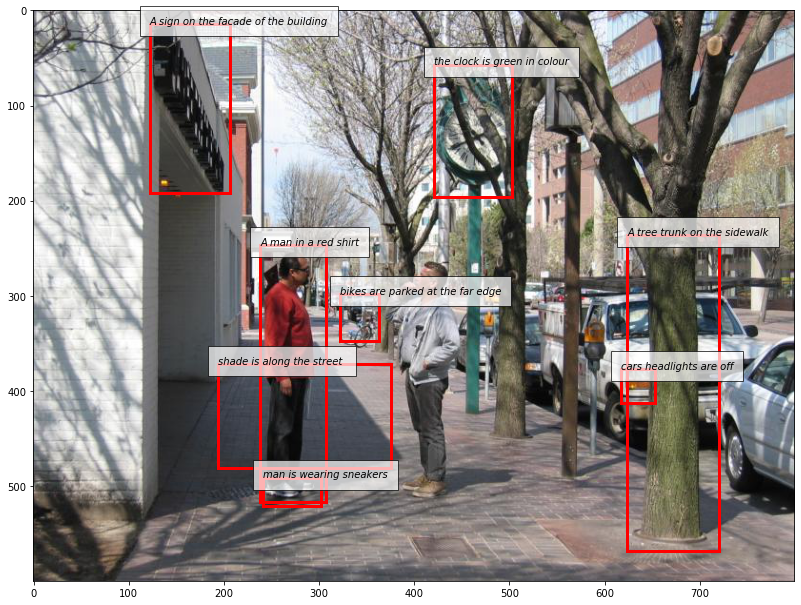

Top 10 most similar images to image 1 in Visual Genome:
Image id: 2410466 Euclidean distance: 0.6757
Image data: id: 2410466, coco_id: 7938, flickr_id: 1327113850, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K_2/2410466.jpg


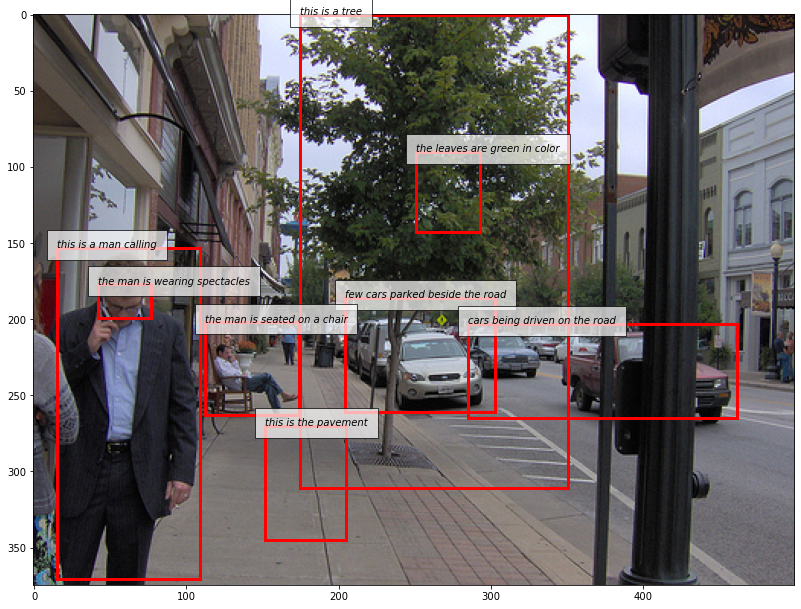

Image id: 2377786 Euclidean distance: 0.6811
Image data: id: 2377786, coco_id: -1, flickr_id: 7156085969, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K_2/2377786.jpg


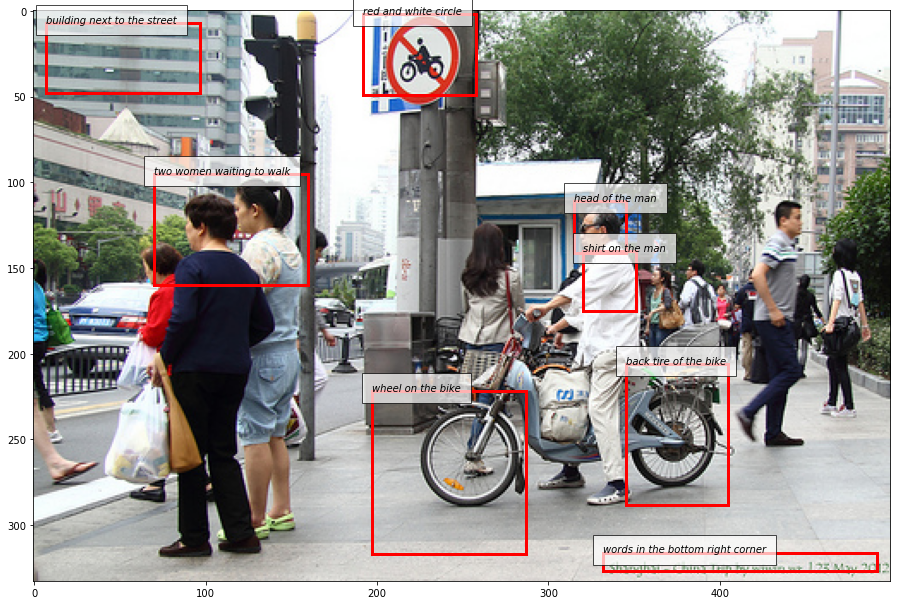

Image id: 2389003 Euclidean distance: 0.7022
Image data: id: 2389003, coco_id: 315830, flickr_id: 8809277294, width: 333, url: https://cs.stanford.edu/people/rak248/VG_100K_2/2389003.jpg


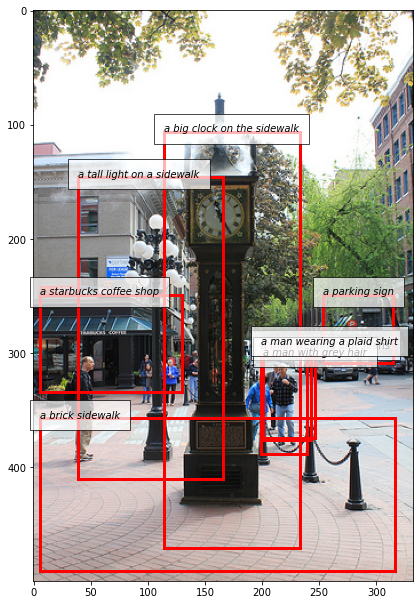

Image id: 2384574 Euclidean distance: 0.7242
Image data: id: 2384574, coco_id: 444262, flickr_id: 478095572, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K_2/2384574.jpg


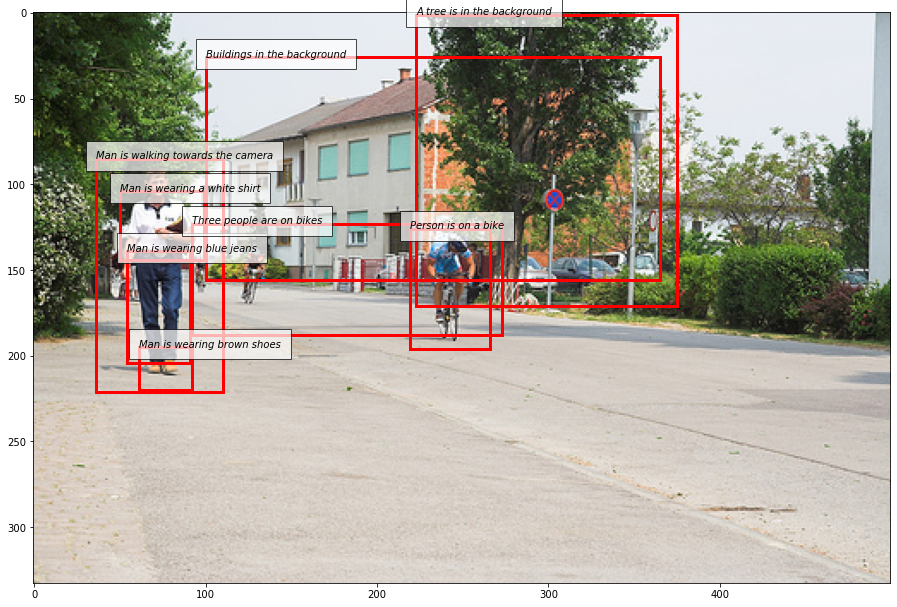

Image id: 1658 Euclidean distance: 0.7251
Image data: id: 1658, coco_id: -1, flickr_id: -1, width: 800, url: https://cs.stanford.edu/people/rak248/VG_100K_2/1658.jpg


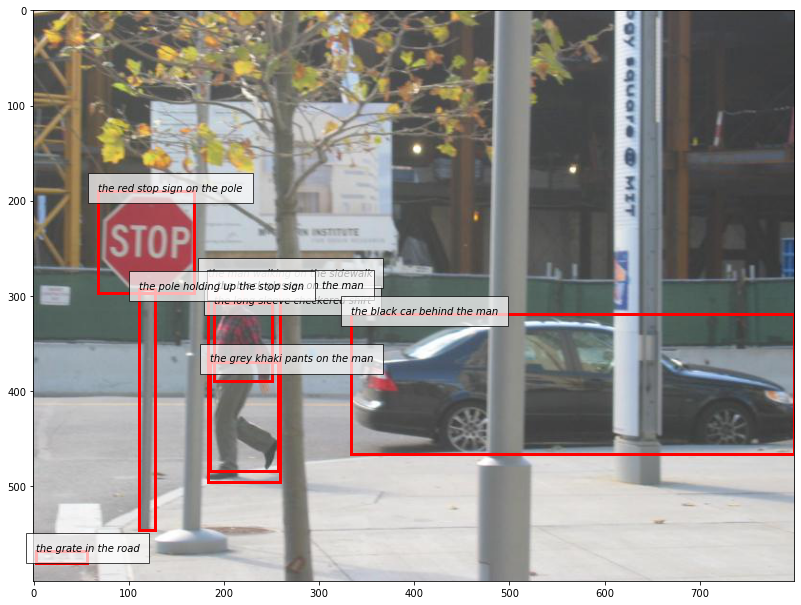

Image id: 2335659 Euclidean distance: 0.7254
Image data: id: 2335659, coco_id: -1, flickr_id: 117506337, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2335659.jpg


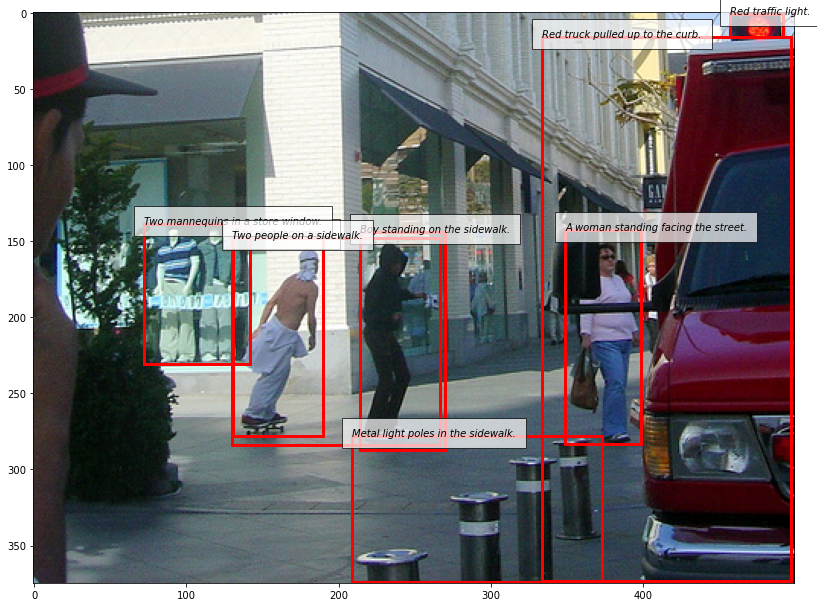

Image id: 2369307 Euclidean distance: 0.7298
Image data: id: 2369307, coco_id: -1, flickr_id: 3508071215, width: 375, url: https://cs.stanford.edu/people/rak248/VG_100K/2369307.jpg


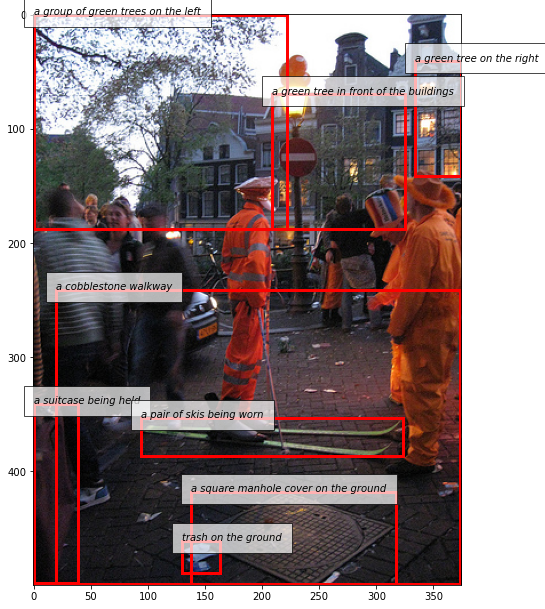

Image id: 2360852 Euclidean distance: 0.7325
Image data: id: 2360852, coco_id: -1, flickr_id: 7153523153, width: 332, url: https://cs.stanford.edu/people/rak248/VG_100K/2360852.jpg


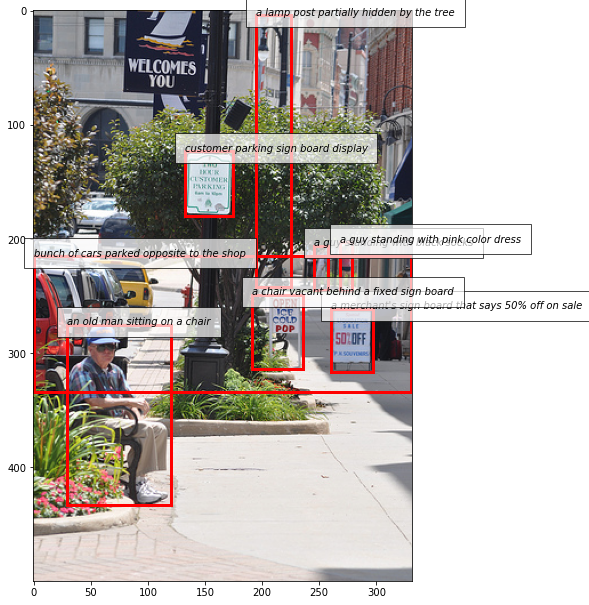

Image id: 2 Euclidean distance: 0.7325
Image data: id: 2, coco_id: -1, flickr_id: -1, width: 800, url: https://cs.stanford.edu/people/rak248/VG_100K/2.jpg


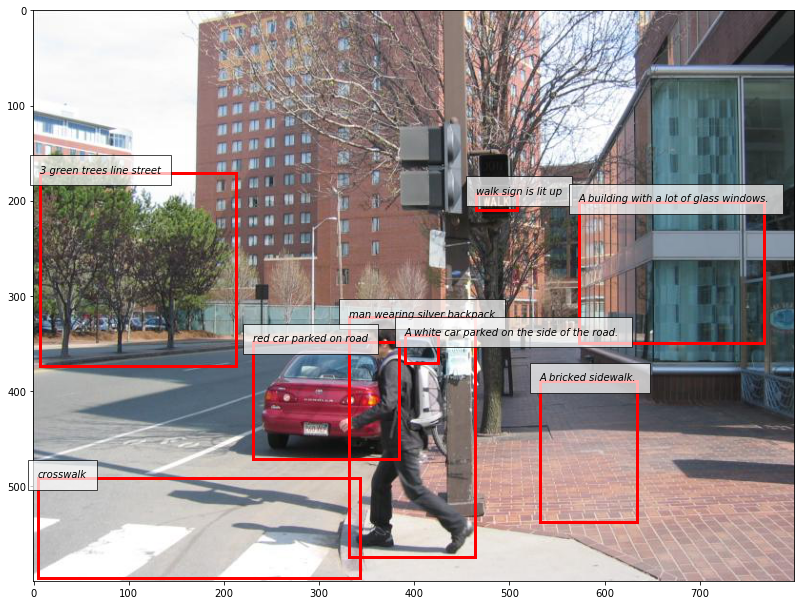

Image id: 26 Euclidean distance: 0.7356
Image data: id: 26, coco_id: -1, flickr_id: -1, width: 800, url: https://cs.stanford.edu/people/rak248/VG_100K/26.jpg


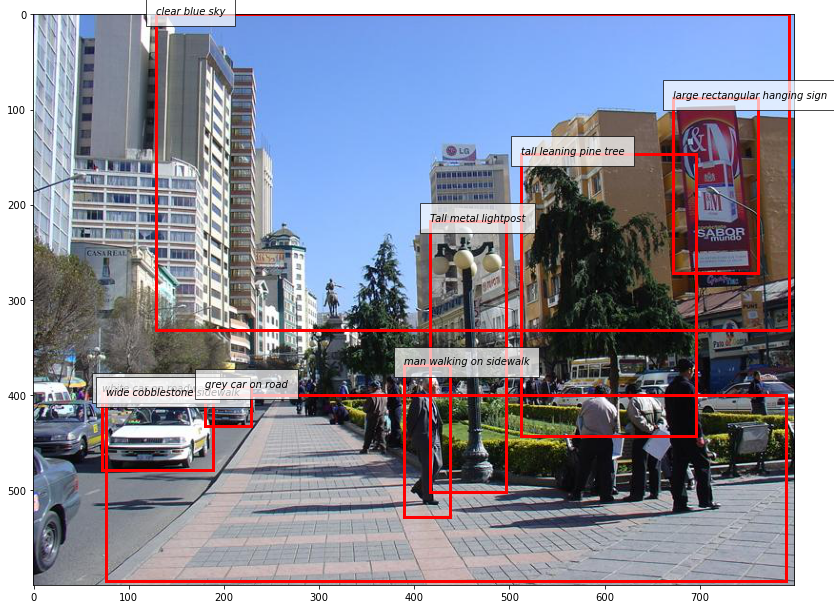

In [94]:
input_id = 1
top_images = retrieve_images(embeddings_method, image_regions, input_id = input_id)

In [72]:
top_images

,image_id,distances
11897,2410466,0.675702
43120,2377786,0.681146
32428,2389003,0.702156
36656,2384574,0.724232
1656,1658,0.725070
83359,2335659,0.725367
51226,2369307,0.729767
59307,2360852,0.732453
0,2,0.732457
24,26,0.735624


## Similar image retrieval based on given user sentence


In [115]:
input_sentence = 'a cat is sleeping on the beach'

In [116]:
input_embedding = get_embeddings(model_4, input_sentence)

In [117]:
input_embedding.shape

(768,)

Images retrieved using method: embeddings_4
Top 10 most similar images to image -1 in Visual Genome:
Image id: 2331669 Euclidean distance: 2.5653
Image data: id: 2331669, coco_id: 155199, flickr_id: 3491028758, width: 375, url: https://cs.stanford.edu/people/rak248/VG_100K/2331669.jpg


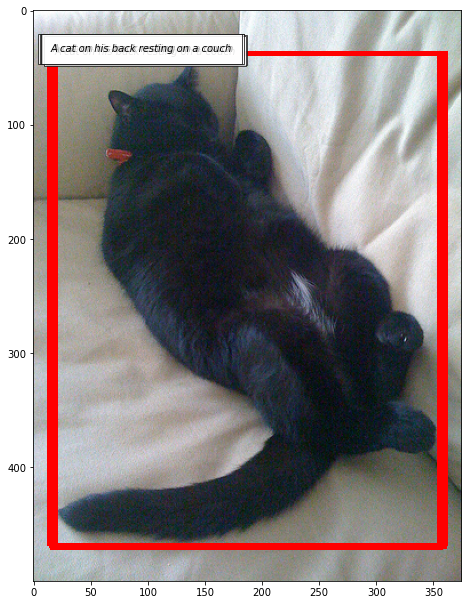

Image id: 2327334 Euclidean distance: 2.6964
Image data: id: 2327334, coco_id: -1, flickr_id: 760075481, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2327334.jpg


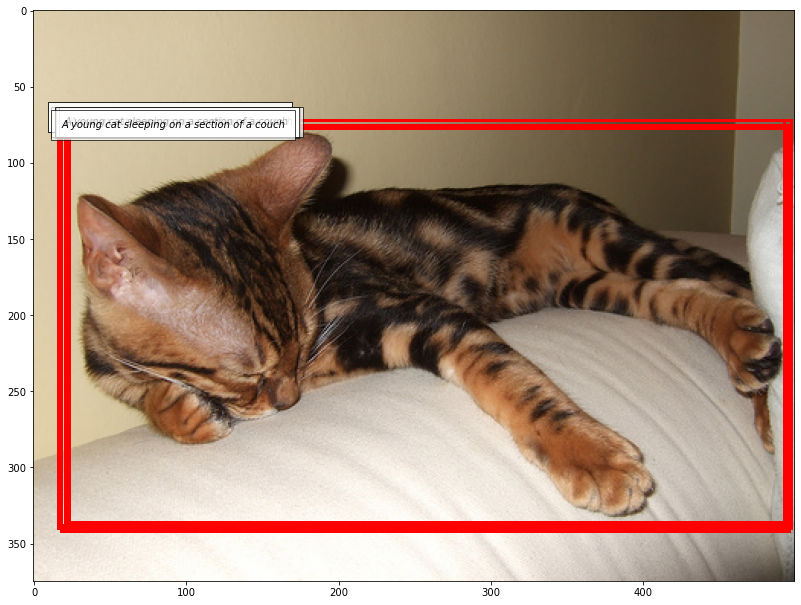

Image id: 2340105 Euclidean distance: 2.7384
Image data: id: 2340105, coco_id: -1, flickr_id: 6448744811, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2340105.jpg


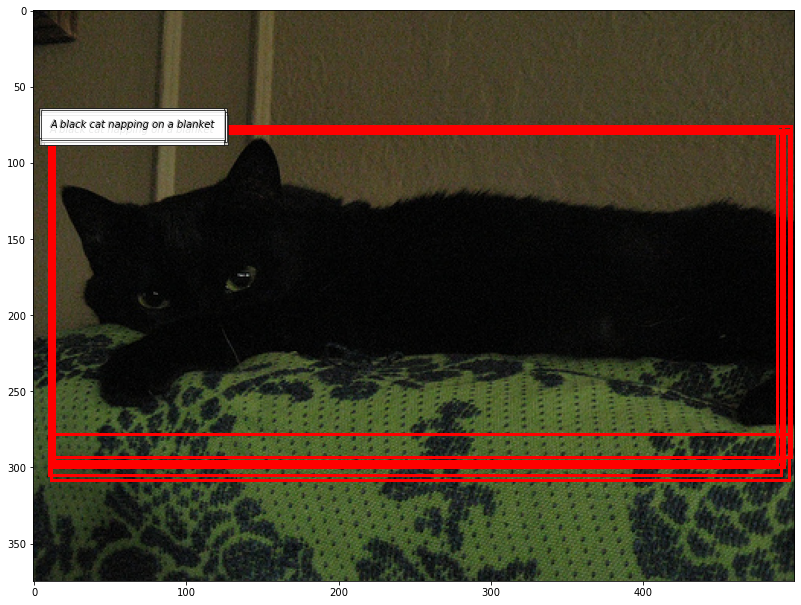

Image id: 2382711 Euclidean distance: 2.7805
Image data: id: 2382711, coco_id: -1, flickr_id: 4383704655, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K_2/2382711.jpg


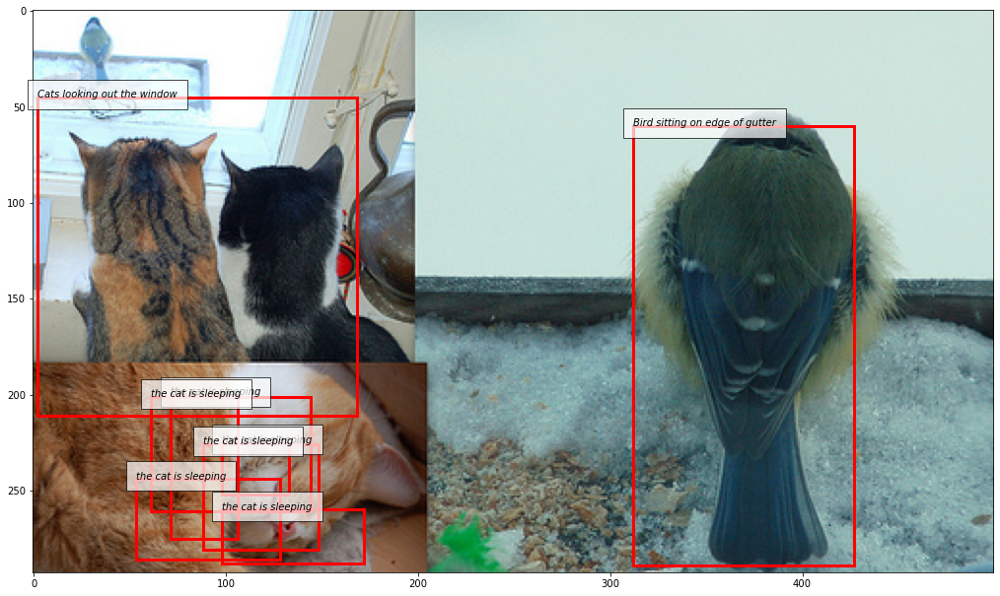

Image id: 2316261 Euclidean distance: 2.7863
Image data: id: 2316261, coco_id: 325598, flickr_id: 9059944697, width: 279, url: https://cs.stanford.edu/people/rak248/VG_100K/2316261.jpg


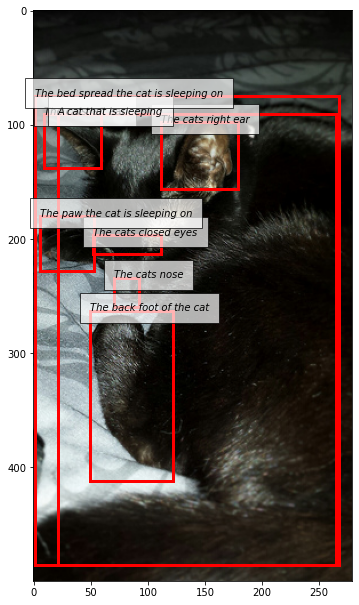

Image id: 2341641 Euclidean distance: 2.7895
Image data: id: 2341641, coco_id: 434329, flickr_id: 5416078, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2341641.jpg


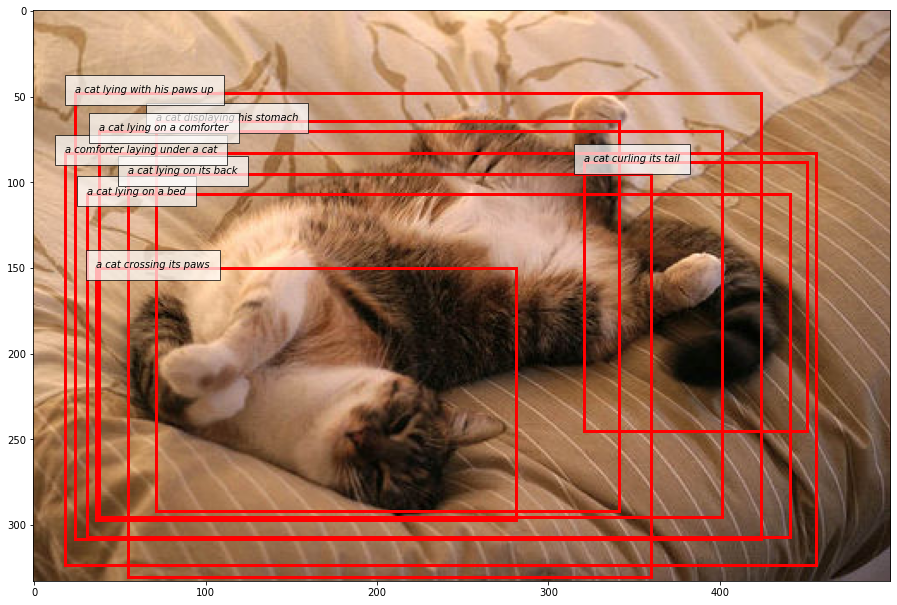

Image id: 2322094 Euclidean distance: 2.7925
Image data: id: 2322094, coco_id: 76522, flickr_id: 263967946, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2322094.jpg


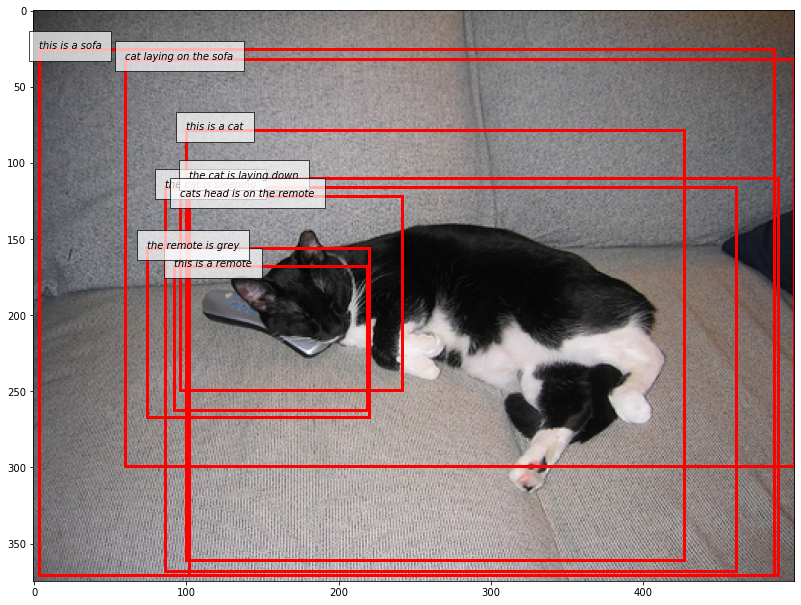

Image id: 2356841 Euclidean distance: 2.7994
Image data: id: 2356841, coco_id: 235842, flickr_id: 2546904630, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2356841.jpg


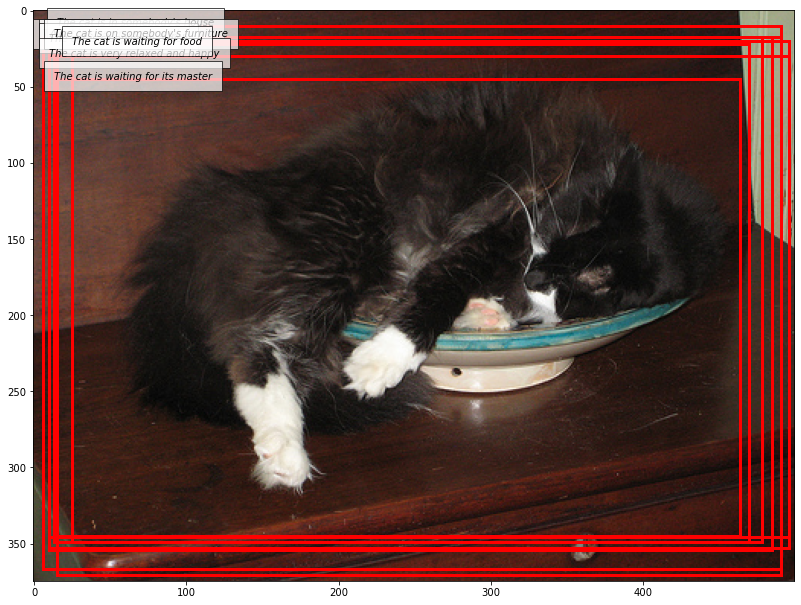

Image id: 2354220 Euclidean distance: 2.8007
Image data: id: 2354220, coco_id: 478927, flickr_id: 2835791112, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2354220.jpg


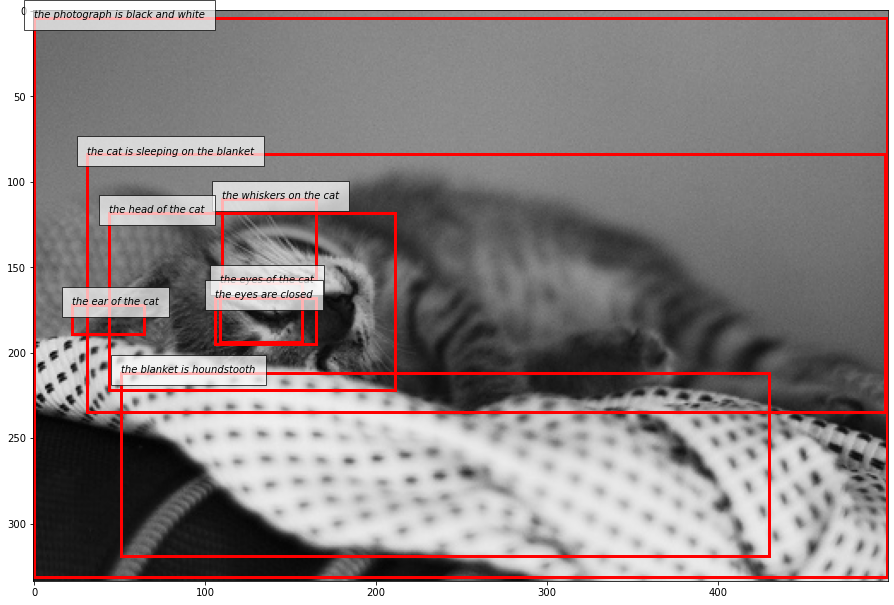

Image id: 2410153 Euclidean distance: 2.8056
Image data: id: 2410153, coco_id: 398489, flickr_id: 169250148, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K_2/2410153.jpg


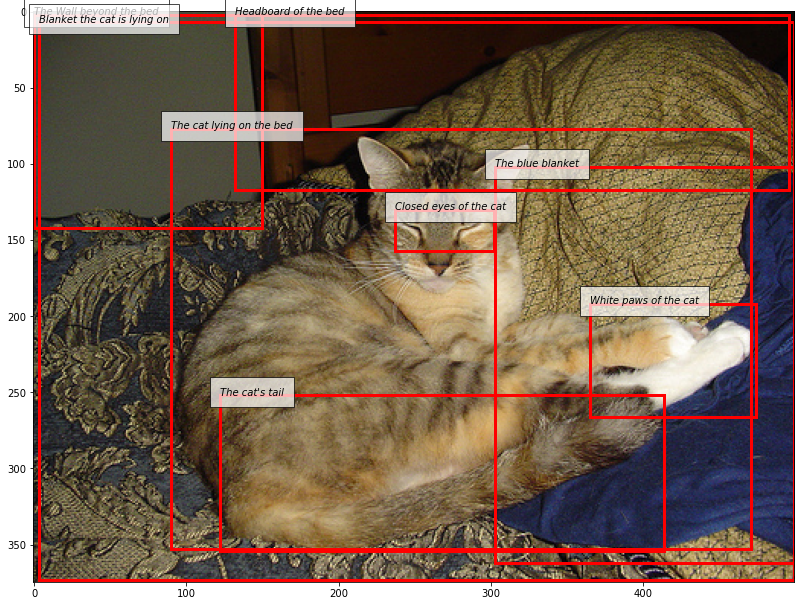

In [118]:
top_images_2 = retrieve_images(embeddings_method, image_regions, input_id = -1, input_embedding=input_embedding)

In [119]:
top_images_2

,image_id,distances
87172,2331669,2.565315
91313,2327334,2.696362
79123,2340105,2.738373
38440,2382711,2.780481
101929,2316261,2.786321
77649,2341641,2.789504
96327,2322094,2.792471
63134,2356841,2.799411
65640,2354220,2.800670
12198,2410153,2.805554
